<a href="https://colab.research.google.com/github/9-coding/ComputerVision_TeamProject/blob/main/ActiveLearning2/ActiveLearning2_modelCompare_rfz_resnet50_d.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
from google.colab import drive
drive.mount('/content/gdrive/')




Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [4]:
import os
# 각자 환경에서 이 부분만 변경하여 사용하면 됩니다.
os.chdir('/content/gdrive/MyDrive/Colab Notebooks/Computer_Vision/ActiveLearning/CUB_200_2011_repackage_class50')
print(os.getcwd())


/content/gdrive/MyDrive/Colab Notebooks/Computer_Vision/ActiveLearning/CUB_200_2011_repackage_class50


In [5]:
!pip install wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 25.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 26.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.9/243.9 kB 33.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.1 MB/s eta 0:00:00


In [6]:
!wandb login f9fc6c65de4904021a59f4c8c60b90961f6ec1fb

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [7]:
!pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 14.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 20.3 MB/s eta 0:00:00


In [8]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import time
import torch
import torchvision.transforms as transforms
import torchvision.models as models
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from PIL import Image
import random
import timm

### wandb ###
import wandb
wandb.init(project='ActiveLearning2_modelCompare')

def set_seed(seed: int = 42) -> None:
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    # When running on the CuDNN backend, two further options must be set
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    # Set a fixed value for the hash seed
    os.environ["PYTHONHASHSEED"] = str(seed)
    print(f"Random seed set as {seed}")

set_seed(42)


### GPU Setting ###
USE_CUDA = torch.cuda.is_available()
DEVICE = torch.device("cuda" if USE_CUDA else "cpu")
print(DEVICE)

### Custom Dataset ###
class CUB2011(Dataset):
    def __init__(self, transform, mode='train'):
        self.transform = transform
        self.mode = mode
        self.image_folder = os.listdir(f'./datasets/{mode}')

    def __len__(self):
        return len(self.image_folder)

    def __getitem__(self, idx):
        img_path = self.image_folder[idx]
        img = Image.open(os.path.join('./datasets', self.mode, img_path)).convert('RGB')
        img = self.transform(img)
        label = int(img_path.split('_')[-1].split('.')[0])
        return (img, label)

wandb: Currently logged in as: kdy1021 (computervisionactivelearning). Use `wandb login --relogin` to force relogin


Random seed set as 42
cuda


In [9]:
### Data Augmentation ###
def transforms_func(transform):
  return transforms.Compose([
    transforms.Resize((448, 448)),
    transform,
    transforms.ToTensor(),
])

def transforms_resize_func(resize):
  return transforms.Compose([
    resize,
    transforms.ToTensor(),
])

ROTATION_DEGREE = 30
zoom_scale = (0.8, 1.2)
transforms_rotation = transforms_func(transforms.RandomRotation(degrees=ROTATION_DEGREE))
transforms_horizontal_flip = transforms_func(transforms.RandomHorizontalFlip(p=1.0))
transforms_zoom = transforms_func(transforms.RandomResizedCrop(448, scale=zoom_scale))

transforms_train = transforms_resize_func(transforms.Resize((448, 448)))
transforms_valtest = transforms_resize_func(transforms.Resize((448, 448)))
transforms_random_resized_crop = transforms_resize_func(transforms.RandomResizedCrop(448, scale=(0.8, 1.0)))

In [10]:
BATCH_SIZE = 32
train_set_with_augmentation = CUB2011(mode='train', transform=transforms_train)

train_set_randomcrop = CUB2011(mode='train', transform=transforms_random_resized_crop)
train_set_rotation = CUB2011(mode='train', transform=transforms_rotation)
train_set_horizontal_flip = CUB2011(mode='train', transform=transforms_horizontal_flip)
train_set_zoom = CUB2011(mode='train', transform=transforms_zoom)

#===============
combined_train_set = ConcatDataset([train_set_with_augmentation, train_set_horizontal_flip, train_set_rotation, train_set_zoom])



val_set = CUB2011(mode='valid', transform=transforms_valtest)
test_set = CUB2011(mode='test', transform=transforms_valtest)

train_loader = DataLoader(combined_train_set, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_set, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_set, batch_size=BATCH_SIZE, shuffle=False)

In [11]:

### Model / Optimizer ###
EPOCH = 15
lr = 0.1
model_name = 'resnet50d'
model = timm.create_model(model_name, pretrained=True)
num_features = model.fc.in_features

# Adjusting for augmentation
model.fc = nn.Linear(num_features, 50)
model = model.to(DEVICE)
optimizer = optim.SGD(model.parameters(), lr=lr)
# scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)
# model.load_state_dict(torch.load('/content/gdrive/MyDrive/best_model_with_augmentation_resnet_d.pth'))

model.safetensors:   0%|          | 0.00/103M [00:00<?, ?B/s]

Train Epoch 0 [0/295]	Loss: 3.942482
Train Epoch 0 [30/295]	Loss: 3.698344
Train Epoch 0 [60/295]	Loss: 3.203501
Train Epoch 0 [90/295]	Loss: 1.418289
Train Epoch 0 [120/295]	Loss: 0.680939
Train Epoch 0 [150/295]	Loss: 0.654802
Train Epoch 0 [180/295]	Loss: 0.634646
Train Epoch 0 [210/295]	Loss: 0.253816
Train Epoch 0 [240/295]	Loss: 0.238388
Train Epoch 0 [270/295]	Loss: 0.253787


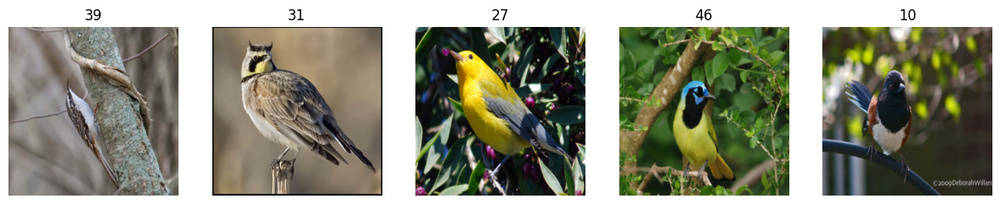

Epoch 0
Train Loss: 0.2572, Validation Loss: 0.3393, Validation Accuracy: 89.86%

Train Epoch 1 [0/295]	Loss: 0.125169
Train Epoch 1 [30/295]	Loss: 0.040189
Train Epoch 1 [60/295]	Loss: 0.138706
Train Epoch 1 [90/295]	Loss: 0.117353
Train Epoch 1 [120/295]	Loss: 0.193280
Train Epoch 1 [150/295]	Loss: 0.049902
Train Epoch 1 [180/295]	Loss: 0.026451
Train Epoch 1 [210/295]	Loss: 0.092914
Train Epoch 1 [240/295]	Loss: 0.060680
Train Epoch 1 [270/295]	Loss: 0.056225


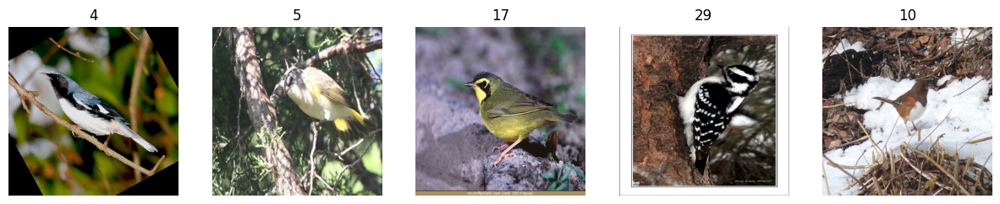

Epoch 1
Train Loss: 0.0521, Validation Loss: 0.2080, Validation Accuracy: 94.26%

Train Epoch 2 [0/295]	Loss: 0.009931
Train Epoch 2 [30/295]	Loss: 0.041081
Train Epoch 2 [60/295]	Loss: 0.009929
Train Epoch 2 [90/295]	Loss: 0.041901
Train Epoch 2 [120/295]	Loss: 0.009755
Train Epoch 2 [150/295]	Loss: 0.017041
Train Epoch 2 [180/295]	Loss: 0.006000
Train Epoch 2 [210/295]	Loss: 0.029313
Train Epoch 2 [240/295]	Loss: 0.014011
Train Epoch 2 [270/295]	Loss: 0.178959


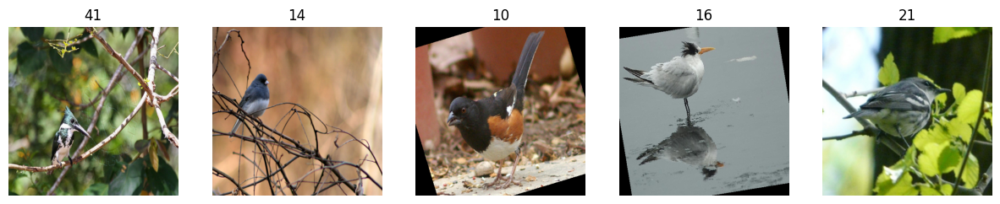

Epoch 2
Train Loss: 0.0080, Validation Loss: 0.1966, Validation Accuracy: 93.58%

Train Epoch 3 [0/295]	Loss: 0.016772
Train Epoch 3 [30/295]	Loss: 0.008625
Train Epoch 3 [60/295]	Loss: 0.008322
Train Epoch 3 [90/295]	Loss: 0.007722
Train Epoch 3 [120/295]	Loss: 0.003169
Train Epoch 3 [150/295]	Loss: 0.005851
Train Epoch 3 [180/295]	Loss: 0.009223
Train Epoch 3 [210/295]	Loss: 0.007461
Train Epoch 3 [240/295]	Loss: 0.006281
Train Epoch 3 [270/295]	Loss: 0.012393


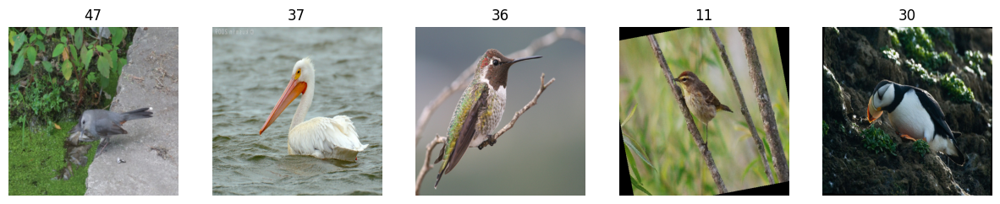

Epoch 3
Train Loss: 0.0113, Validation Loss: 0.2377, Validation Accuracy: 92.57%

Train Epoch 4 [0/295]	Loss: 0.043558
Train Epoch 4 [30/295]	Loss: 0.017220
Train Epoch 4 [60/295]	Loss: 0.004668
Train Epoch 4 [90/295]	Loss: 0.007330
Train Epoch 4 [120/295]	Loss: 0.013227
Train Epoch 4 [150/295]	Loss: 0.014590
Train Epoch 4 [180/295]	Loss: 0.009707
Train Epoch 4 [210/295]	Loss: 0.010178
Train Epoch 4 [240/295]	Loss: 0.013042
Train Epoch 4 [270/295]	Loss: 0.003292


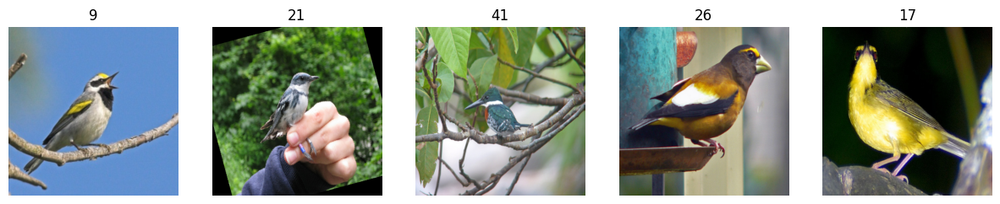

Epoch 4
Train Loss: 0.0066, Validation Loss: 0.2803, Validation Accuracy: 94.59%

Train Epoch 5 [0/295]	Loss: 0.038884
Train Epoch 5 [30/295]	Loss: 0.044319
Train Epoch 5 [60/295]	Loss: 0.005666
Train Epoch 5 [90/295]	Loss: 0.003083
Train Epoch 5 [120/295]	Loss: 0.028803
Train Epoch 5 [150/295]	Loss: 0.024639
Train Epoch 5 [180/295]	Loss: 0.007158
Train Epoch 5 [210/295]	Loss: 0.005367
Train Epoch 5 [240/295]	Loss: 0.001412
Train Epoch 5 [270/295]	Loss: 0.003307


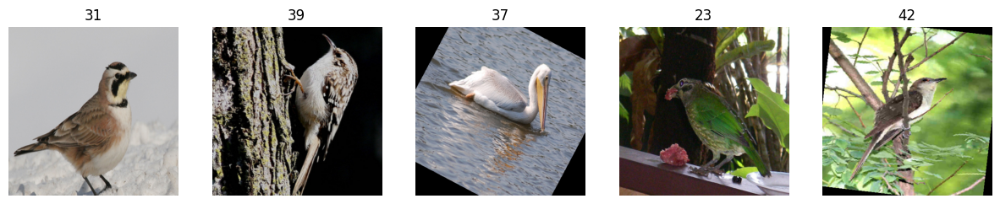

Epoch 5
Train Loss: 0.0022, Validation Loss: 0.1972, Validation Accuracy: 95.95%

Train Epoch 6 [0/295]	Loss: 0.003273
Train Epoch 6 [30/295]	Loss: 0.002363
Train Epoch 6 [60/295]	Loss: 0.003357
Train Epoch 6 [90/295]	Loss: 0.001183
Train Epoch 6 [120/295]	Loss: 0.001461
Train Epoch 6 [150/295]	Loss: 0.002584
Train Epoch 6 [180/295]	Loss: 0.006137
Train Epoch 6 [210/295]	Loss: 0.001490
Train Epoch 6 [240/295]	Loss: 0.016016
Train Epoch 6 [270/295]	Loss: 0.009412


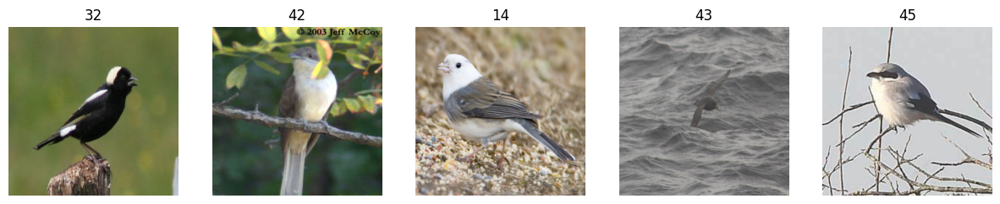

Epoch 6
Train Loss: 0.0042, Validation Loss: 0.2092, Validation Accuracy: 95.27%

Train Epoch 7 [0/295]	Loss: 0.005665
Train Epoch 7 [30/295]	Loss: 0.002137
Train Epoch 7 [60/295]	Loss: 0.001509
Train Epoch 7 [90/295]	Loss: 0.001471
Train Epoch 7 [120/295]	Loss: 0.001837
Train Epoch 7 [150/295]	Loss: 0.002324
Train Epoch 7 [180/295]	Loss: 0.003584
Train Epoch 7 [210/295]	Loss: 0.003161
Train Epoch 7 [240/295]	Loss: 0.001449
Train Epoch 7 [270/295]	Loss: 0.003551


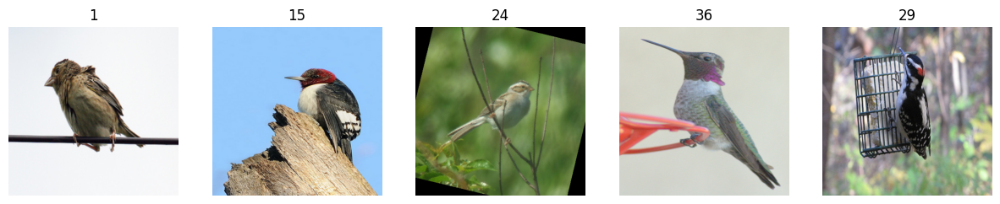

Epoch 7
Train Loss: 0.0008, Validation Loss: 0.1899, Validation Accuracy: 95.61%

Train Epoch 8 [0/295]	Loss: 0.004876
Train Epoch 8 [30/295]	Loss: 0.002149
Train Epoch 8 [60/295]	Loss: 0.002651
Train Epoch 8 [90/295]	Loss: 0.000679
Train Epoch 8 [120/295]	Loss: 0.001559
Train Epoch 8 [150/295]	Loss: 0.002085
Train Epoch 8 [180/295]	Loss: 0.001180
Train Epoch 8 [210/295]	Loss: 0.001957
Train Epoch 8 [240/295]	Loss: 0.000742
Train Epoch 8 [270/295]	Loss: 0.001388


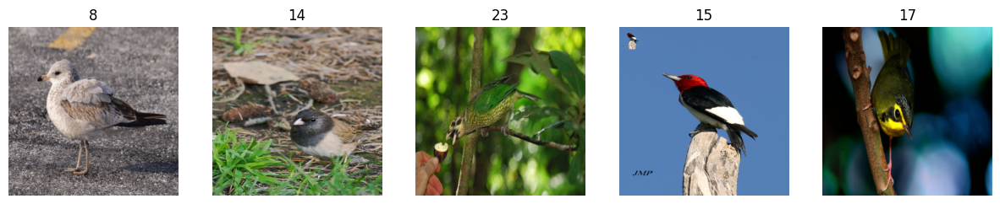

Epoch 8
Train Loss: 0.0009, Validation Loss: 0.2048, Validation Accuracy: 94.59%

Train Epoch 9 [0/295]	Loss: 0.008135
Train Epoch 9 [30/295]	Loss: 0.001363
Train Epoch 9 [60/295]	Loss: 0.002704
Train Epoch 9 [90/295]	Loss: 0.003713
Train Epoch 9 [120/295]	Loss: 0.000857
Train Epoch 9 [150/295]	Loss: 0.001120
Train Epoch 9 [180/295]	Loss: 0.003598
Train Epoch 9 [210/295]	Loss: 0.000829
Train Epoch 9 [240/295]	Loss: 0.004045
Train Epoch 9 [270/295]	Loss: 0.001954


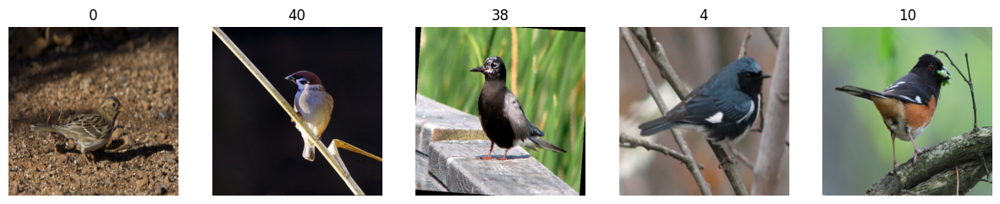

Epoch 9
Train Loss: 0.0026, Validation Loss: 0.1854, Validation Accuracy: 95.95%

Train Epoch 10 [0/295]	Loss: 0.002054
Train Epoch 10 [30/295]	Loss: 0.000862
Train Epoch 10 [60/295]	Loss: 0.002868
Train Epoch 10 [90/295]	Loss: 0.002869
Train Epoch 10 [120/295]	Loss: 0.002184
Train Epoch 10 [150/295]	Loss: 0.001032
Train Epoch 10 [180/295]	Loss: 0.001068
Train Epoch 10 [210/295]	Loss: 0.000726
Train Epoch 10 [240/295]	Loss: 0.000971
Train Epoch 10 [270/295]	Loss: 0.000612


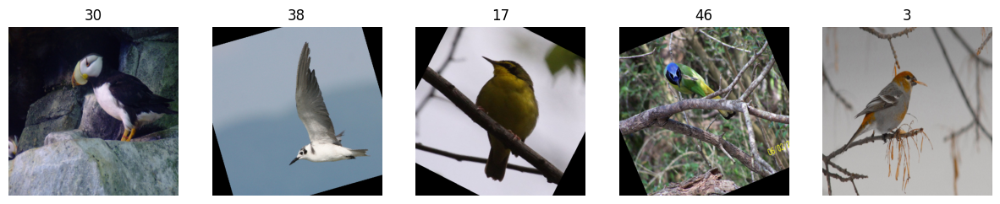

Epoch 10
Train Loss: 0.0027, Validation Loss: 0.2256, Validation Accuracy: 95.61%

Train Epoch 11 [0/295]	Loss: 0.003080
Train Epoch 11 [30/295]	Loss: 0.000772
Train Epoch 11 [60/295]	Loss: 0.000442
Train Epoch 11 [90/295]	Loss: 0.000709
Train Epoch 11 [120/295]	Loss: 0.000605
Train Epoch 11 [150/295]	Loss: 0.001413
Train Epoch 11 [180/295]	Loss: 0.003040
Train Epoch 11 [210/295]	Loss: 0.000965
Train Epoch 11 [240/295]	Loss: 0.004863
Train Epoch 11 [270/295]	Loss: 0.001006


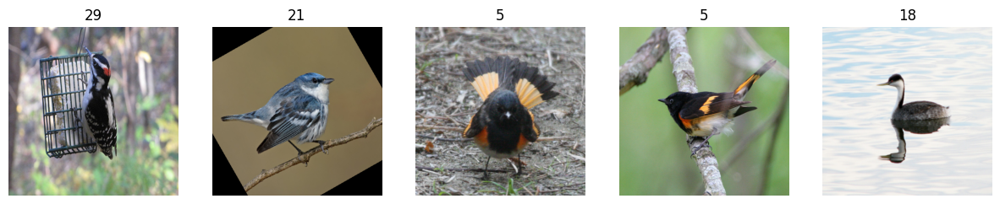

Epoch 11
Train Loss: 0.0015, Validation Loss: 0.1781, Validation Accuracy: 95.95%

Train Epoch 12 [0/295]	Loss: 0.012103
Train Epoch 12 [30/295]	Loss: 0.001005
Train Epoch 12 [60/295]	Loss: 0.000802
Train Epoch 12 [90/295]	Loss: 0.005546
Train Epoch 12 [120/295]	Loss: 0.001719
Train Epoch 12 [150/295]	Loss: 0.000785
Train Epoch 12 [180/295]	Loss: 0.000922
Train Epoch 12 [210/295]	Loss: 0.000664
Train Epoch 12 [240/295]	Loss: 0.000820
Train Epoch 12 [270/295]	Loss: 0.000719


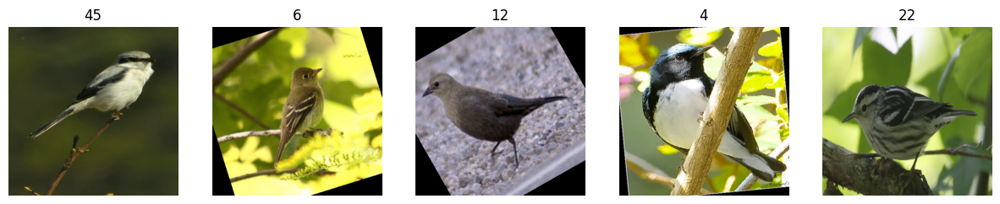

Epoch 12
Train Loss: 0.0006, Validation Loss: 0.1774, Validation Accuracy: 96.28%

Train Epoch 13 [0/295]	Loss: 0.001321
Train Epoch 13 [30/295]	Loss: 0.001074
Train Epoch 13 [60/295]	Loss: 0.001846
Train Epoch 13 [90/295]	Loss: 0.000893
Train Epoch 13 [120/295]	Loss: 0.001254
Train Epoch 13 [150/295]	Loss: 0.007134
Train Epoch 13 [180/295]	Loss: 0.000976
Train Epoch 13 [210/295]	Loss: 0.000936
Train Epoch 13 [240/295]	Loss: 0.000334
Train Epoch 13 [270/295]	Loss: 0.001531


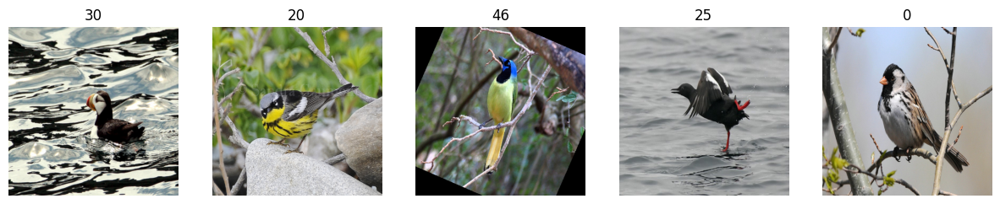

Epoch 13
Train Loss: 0.0005, Validation Loss: 0.1894, Validation Accuracy: 95.95%

Train Epoch 14 [0/295]	Loss: 0.000563
Train Epoch 14 [30/295]	Loss: 0.000340
Train Epoch 14 [60/295]	Loss: 0.001051
Train Epoch 14 [90/295]	Loss: 0.000463
Train Epoch 14 [120/295]	Loss: 0.000343
Train Epoch 14 [150/295]	Loss: 0.001216
Train Epoch 14 [180/295]	Loss: 0.001855
Train Epoch 14 [210/295]	Loss: 0.000553
Train Epoch 14 [240/295]	Loss: 0.000906
Train Epoch 14 [270/295]	Loss: 0.000501


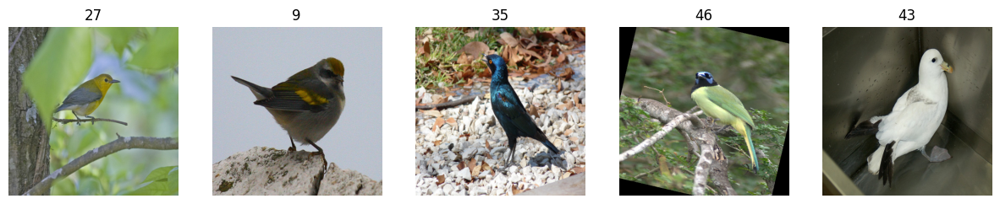

Epoch 14
Train Loss: 0.0018, Validation Loss: 0.2036, Validation Accuracy: 94.93%

[FINAL with Augmentation] Test Loss: 0.1889, Accuracy: 96.3087%
Best Accuracy: 96.28%
Elapsed Time: 1h, 40m, 0s
time: 1h, 100m, 0s


In [12]:
### Train/Evaluation ###
def train(model, train_loader, optimizer, epoch):
    model.train()
    for i, (image, target) in enumerate(train_loader):
        image, target = image.to(DEVICE), target.to(DEVICE)
        output = model(image)
        optimizer.zero_grad()
        train_loss = F.cross_entropy(output, target).to(DEVICE)
        train_loss.backward()
        optimizer.step()

        if i % 30 == 0:
            print(f'Train Epoch {epoch} [{i}/{len(train_loader)}]\tLoss: {train_loss.item():.6f}')
    return train_loss

def evaluate(model, val_loader):
    model.eval()
    eval_loss = 0
    correct = 0
    with torch.no_grad():
        for i, (image, target) in enumerate(val_loader):
            image, target = image.to(DEVICE), target.to(DEVICE)
            output = model(image)
            eval_loss += F.cross_entropy(output, target, reduction='sum').item()
            pred = output.max(1, keepdim=True)[1]
            correct += pred.eq(target.view_as(pred)).sum().item()
        eval_loss /= len(val_loader.dataset)
        eval_accuracy = 100 * correct / len(val_loader.dataset)
        return eval_loss, eval_accuracy

### Main ###
start = time.time()
best = 0
# best_without_augmentation = 0

### wandb ###
wandb.watch(model, log="all")
# wandb.watch(model_without_augmentation, log="all")

for epoch in range(EPOCH):
    # With Augmentation
    train_loss = train(model, train_loader, optimizer, epoch)
    val_loss, val_accuracy = evaluate(model, val_loader)

   # Logging for model with augmentation
    wandb.log({
        'epoch': epoch,
        'train_loss_with_aug': train_loss.item(),
        'val_loss_with_aug': val_loss,
        'val_accuracy_with_aug': val_accuracy
    })

    # Save best model
    if val_accuracy > best:
        best = val_accuracy
        torch.save(model.state_dict(), "./best_model_with_augmentation_resnet_d.pth")

    # augmentation 적용한 이미지 보기
    dataiter = iter(train_loader)
    images, labels = dataiter.__next__()
    fig, axes = plt.subplots(1, 5, figsize=(15, 5))
    for i in range(5):
      image = images[i].numpy().transpose((1, 2, 0))
      image = np.clip(image, 0, 1)
      axes[i].imshow(image)
      axes[i].set_title(labels[i].item())
      axes[i].axis('off')
    plt.show()
    # scheduler.step()
    print(f'Epoch {epoch}')
    print(f"Train Loss: {train_loss.item():.4f}, Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")
    # print(f"Without Augmentation - Train Loss: {train_loss_without_augmentation.item():.4f}, Validation Loss: {val_loss_without_augmentation:.4f}, Validation Accuracy: {val_accuracy_without_augmentation:.2f}%")
    print("")

# Test results
test_loss, test_accuracy = evaluate(model, test_loader)

print(f'[FINAL with Augmentation] Test Loss: {test_loss:.4f}, Accuracy: {test_accuracy:.4f}%')
wandb.log({'test_accuracy_with_aug': test_accuracy})

end = time.time()
elasped_time = end - start
print(f"Best Accuracy: {best:.2f}%")
print(f"Elapsed Time: {int(elasped_time/3600)}h, {int((elasped_time%3600)/60)}m, {int(elasped_time%60)}s")
print(f"time: {int (elasped_time/3600)}h, {int(elasped_time/60)}m, {int(elasped_time%60)}s")

In [13]:
# Test results
test_loss, test_accuracy = evaluate(model, test_loader)

print(f'[FINAL with Augmentation] Test Loss: {test_loss:.4f}, Accuracy: {test_accuracy:.4f}%')
wandb.log({'test_accuracy_with_aug': test_accuracy})

end = time.time()
elasped_time = end - start
print(f"Best Accuracy: {best:.2f}%")
print(f"Elapsed Time: {int(elasped_time/3600)}h, {int((elasped_time%3600)/60)}m, {int(elasped_time%60)}s")
print(f"time: {int (elasped_time/3600)}h, {int(elasped_time/60)}m, {int(elasped_time%60)}s")

[FINAL with Augmentation] Test Loss: 0.1889, Accuracy: 96.3087%
Best Accuracy: 96.28%
Elapsed Time: 1h, 40m, 6s
time: 1h, 100m, 6s


In [14]:
wandb.log({'test_accuracy_with_aug': test_accuracy})

In [15]:
torch.save(model.state_dict(), "./model_state_dict.pt")

SGD, Adam, NAdam
( https://pytorch.org/docs/stable/generated/torch.optim.SGD.html )

1. Learning rate = 0.1, 0.01, 0.001
2. EPOCH = 5, 10, 15, 20, 25
3. Batch size = 8, 16, 32, 64, 128

# At SGD
4. momentum (defalut:0) = 0.9 ~

# At Adam (Adamw)
4. betas (Tuple[float, float], optional) – coefficients used for computing running averages of gradient and its square (default: (0.9, 0.999))
5. eps (float, optional) – term added to the denominator to improve numerical stability (default: 1e-8)

# At NAdam
4. betas (Tuple[float, float], optional) – coefficients used for computing running averages of gradient and its square (default: (0.9, 0.999))
5. eps (float, optional) – term added to the denominator to improve numerical stability (default: 1e-8)


In [16]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 15.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.4.8-py3-none-any.whl size=38244 sha256=be8e8e5ef14295db79e60f8dbaeba95a00df656155267b975f9eb26554efd55b
  Stored in directory: /root/.cache/pip/wheels/f8/04/36/94ff3c8a4215826a21946b34c01180817e606989fdf53f7cd6
Successfully built grad-cam


15


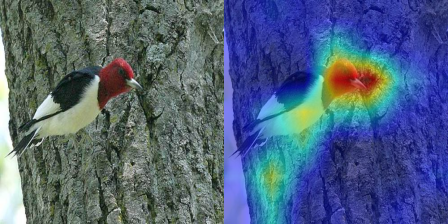

7


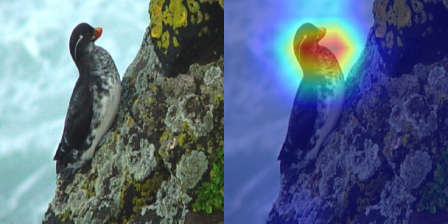

37


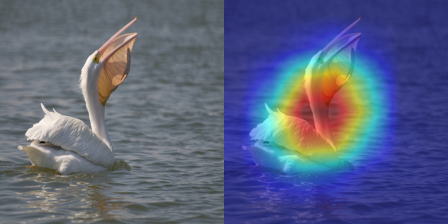

42


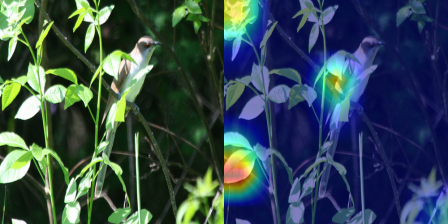

18


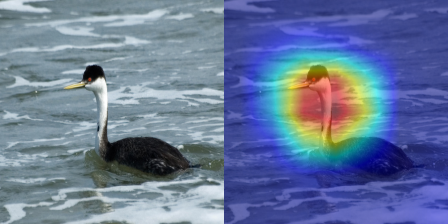

35


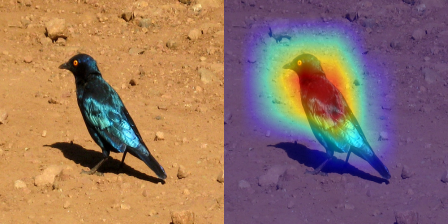

17


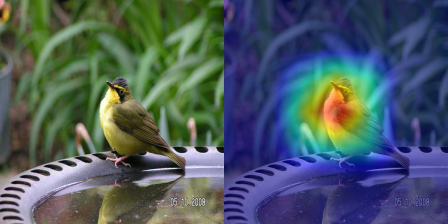

49


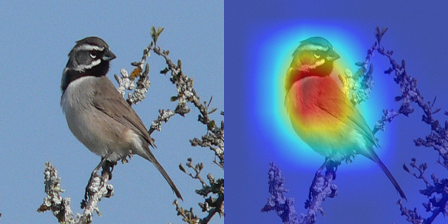

29


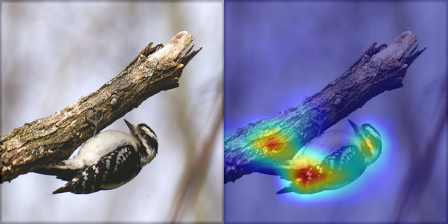

47


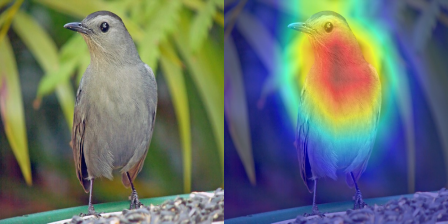

5


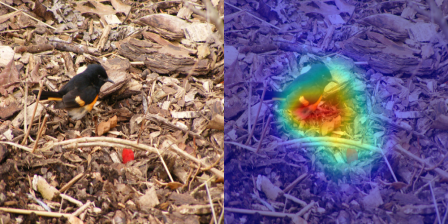

33


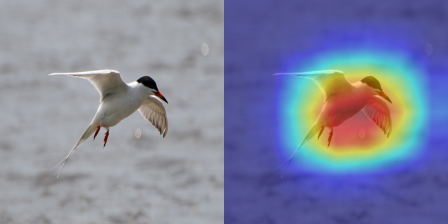

4


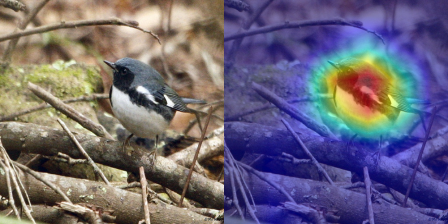

48


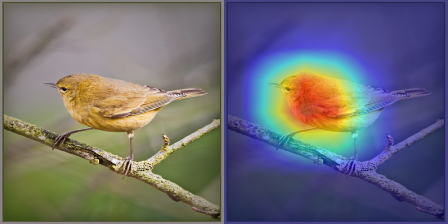

39


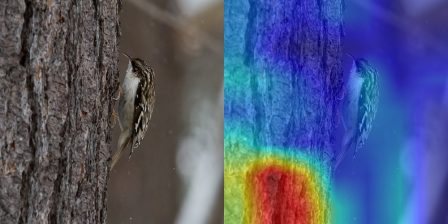

13


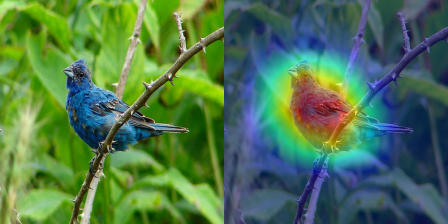

30


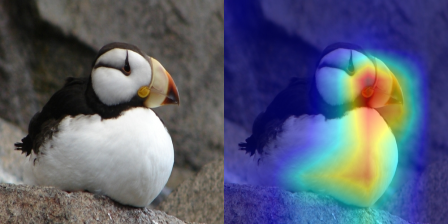

1


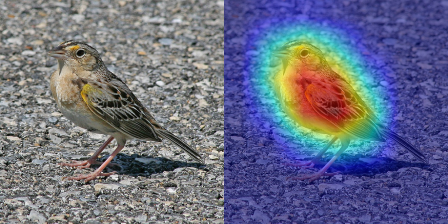

17


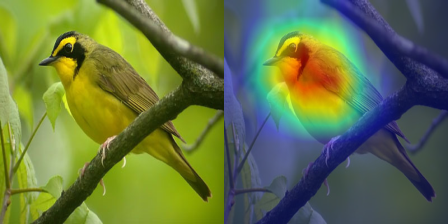

25


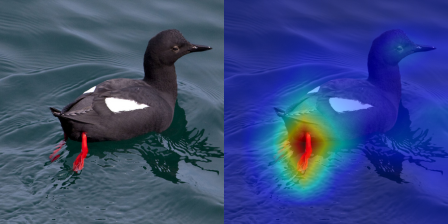

43


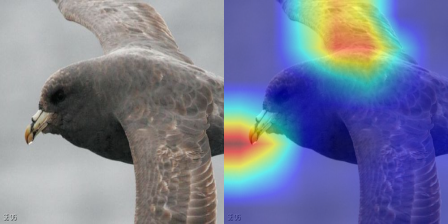

35


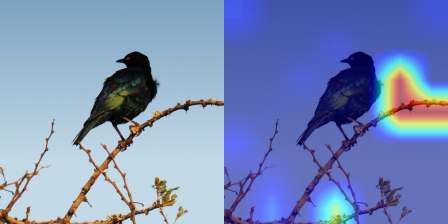

43


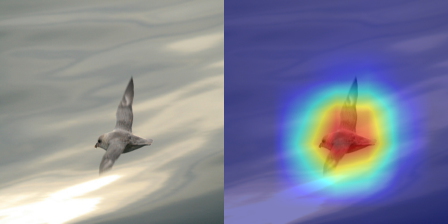

33


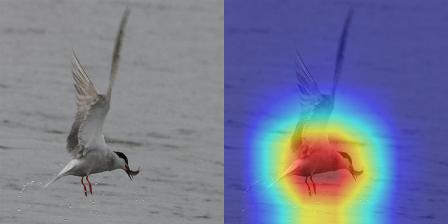

10


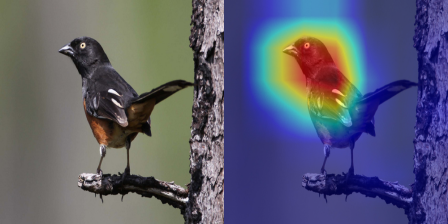

33


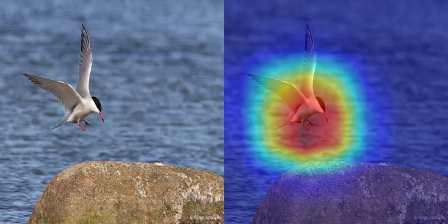

18


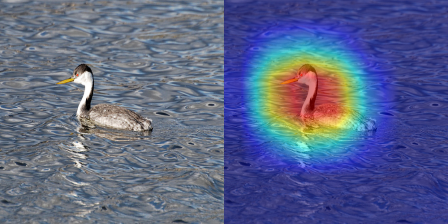

37


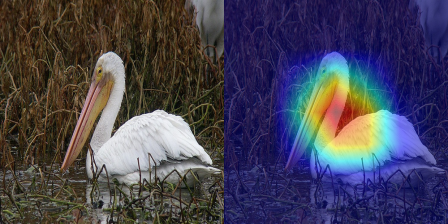

16


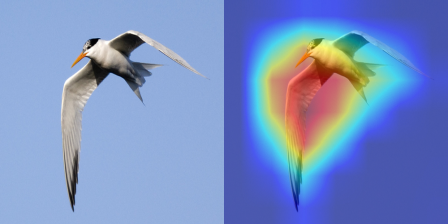

30


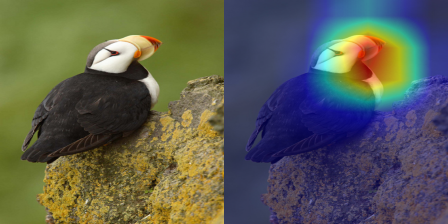

21


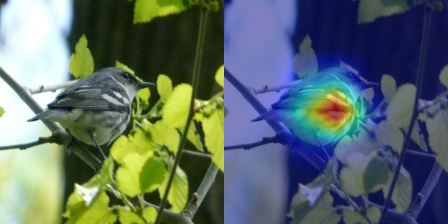

30


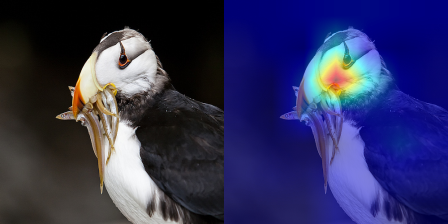

44


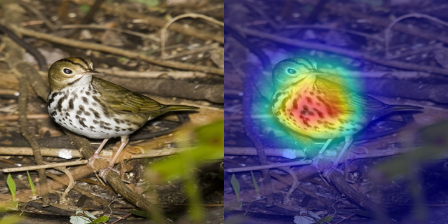

42


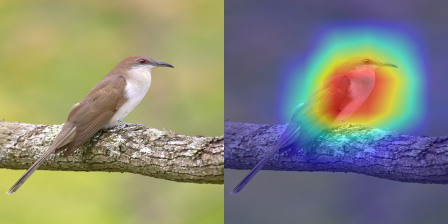

6


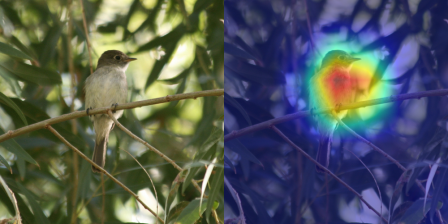

14


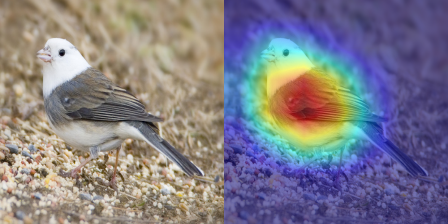

8


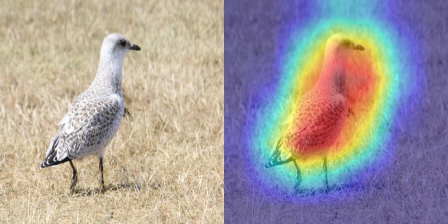

32


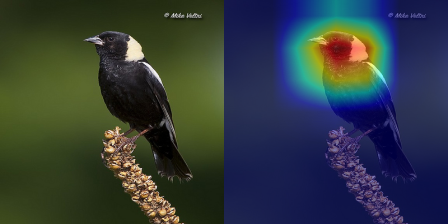

27


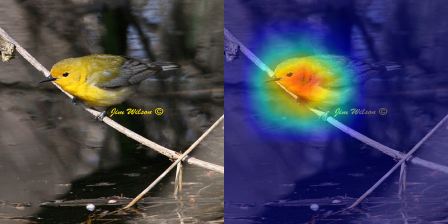

1


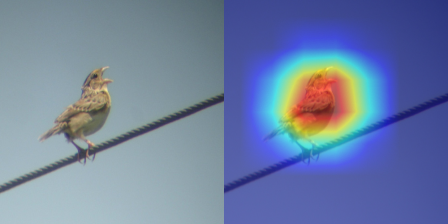

In [17]:
import warnings
warnings.filterwarnings('ignore')
from torchvision import models
import numpy as np
import cv2
import requests
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image, deprocess_image, preprocess_image
from PIL import Image
from google.colab.patches import cv2_imshow

model.eval()

def gradCAM(num):
  global model
  image_tensor, label = train_set_with_augmentation[num]
  print(label)
  img = image_tensor.permute(1, 2, 0).numpy()  # Convert tensor to NumPy array
  img = cv2.resize(img, (224, 224))
  input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
  targets = [ClassifierOutputTarget(label)]
  target_layers = [model.layer4[-1]]
  input_tensor = torch.Tensor(input_tensor).cuda()
  with GradCAM(model=model, target_layers=target_layers) as cam:
      grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
      cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
  cam = np.uint8(255*grayscale_cams[0, :])
  cam = cv2.merge([cam, cam])
  images = np.hstack((np.uint8(255*img), cam_image))
  Image.fromarray(images)

  images = cv2.cvtColor(images, cv2.COLOR_BGR2RGB)

  cv2_imshow(images)

for i in range(200):
  if i % 5 == 0:
    gradCAM(i)
